In [1]:
import datetime
import numpy as np
import pandas as pd
import xarray as xr
import astropy.units as u
import matplotlib.pyplot as plt
import matplotlib.gridspec as grd
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
#from evaluation_functions import ensemble_evaluation_functions as eef
#import sunspots.sunspots as sunspots
import re  #for dealing with non-numeric characters in a string of unknown length

import matplotlib as mpl
import os
import time

import huxt as H
import huxt_analysis as HA
import huxt_inputs as Hin

import scipy.interpolate
from scipy import integrate
from scipy.optimize import curve_fit

from sunpy.coordinates.sun import carrington_rotation_time
from sunpy.coordinates.sun import carrington_rotation_number

# ensemble functions
import huxt_ensemble_functions as hef 
import calibration_functions as cf

In [2]:
def ICMElist(filepath = None):
    # -*- coding: utf-8 -*-
    """
    A script to read and process Ian Richardson's ICME list.

    Some pre-processing is required:
        Download the following webpage as a html file: 
            http://www.srl.caltech.edu/ACE/ASC/DATA/level3/icmetable2.htm
        Open in Excel, remove the year rows, delete last column (S) which is empty
        Cut out the data table only (delete header and footer)
        Save as a CSV.

    """
    
    if filepath is None:
        datapath =  system._setup_dirs_()['datapath']
        filepath = os.path.join(datapath,
                                'icmetable.csv')
    
    
    icmes=pd.read_csv(filepath,header=None)
    #delete the first row
    icmes.drop(icmes.index[0], inplace=True)
    icmes.index = range(len(icmes))
    
    for rownum in range(0,len(icmes)):
        for colnum in range(0,3):
            #convert the three date stamps
            datestr=icmes[colnum][rownum]
            year=int(datestr[:4])
            month=int(datestr[5:7])
            day=int(datestr[8:10])
            hour=int(datestr[11:13])
            minute=int(datestr[13:15])
            #icmes.set_value(rownum,colnum,datetime(year,month, day,hour,minute,0))
            icmes.at[rownum,colnum] = datetime.datetime(year,month, day,hour,minute,0)
            
        #tidy up the plasma properties
        for paramno in range(10,17):
            dv=str(icmes[paramno][rownum])
            if dv == '...' or dv == 'dg' or dv == 'nan':
                #icmes.set_value(rownum,paramno,np.nan)
                icmes.at[rownum,paramno] = np.nan
            else:
                #remove any remaining non-numeric characters
                dv=re.sub('[^0-9]','', dv)
                #icmes.set_value(rownum,paramno,float(dv))
                icmes.at[rownum,paramno] = float(dv)
        
    
    #chage teh column headings
    icmes=icmes.rename(columns = {0:'Shock_time',
                                  1:'ICME_start',
                                  2:'ICME_end',
                                  10:'dV',
                                  11: 'V_mean',
                                  12:'V_max',
                                  13:'Bmag',
                                  14:'MCflag',
                                  15:'Dst',
                                  16:'V_transit'})
    return icmes

def compute_lead_time_stats(df):

    df_ = df.copy()
    
    # Calculating the statistics
    df_['mean'] = df_.mean(axis=1)
    df_['median'] = df_.median(axis=1)
    df_['min'] = df_.min(axis=1)
    df_['max'] = df_.max(axis=1)
    df_['lower_1_sigma'] = df_.apply(lambda row: np.percentile(row, 15.87), axis=1)
    df_['upper_1_sigma'] = df_.apply(lambda row: np.percentile(row, 84.13), axis=1)
    df_['lower_2_sigma'] = df_.apply(lambda row: np.percentile(row, 2.28), axis=1)
    df_['upper_2_sigma'] = df_.apply(lambda row: np.percentile(row, 97.72), axis=1)

    return df_

def date_from_ensemble_folder_name(fname):
    
    """
    extracts date from wsa filename

    Args:
        fname (string) : name of ensemble file set
    Returns:
        date_string (string) : date string generated from info within file string format
        date_obj (datetime) : datetime object from file name
    """

    pattern = r'_(\d{4})(\d{2})(\d{2})(\d{2})'
    match = re.search(pattern, fname)
    year, month, day, hour = match.groups()
    date_string = f'{year}-{month}-{day}--{hour}'
    date_obj = datetime.datetime.strptime(date_string, '%Y-%m-%d--%H')

    return date_string, date_obj

In [10]:
def read_daily_ensemble_sets(ensemble_size, sigma_latitude, sigma_longitude,  year_str, start_date, end_date, gen_dist, observations):

    year_id = {'2023':'_2023', '2020':'_2020'} # awkward file string formating stuff which will be removed when I fix the file name consistency

    # get all ensemble netCDF file strings of specified parameters
    ensemble_directory_path = os.path.abspath(os.path.join(os.pardir,'data','ensembles'))
    ensemble_file_words = [f'ens_{int(sigma_latitude)}_{ensemble_size}_wsa{year_id[year_str]}{gen_dist}'] # keywords to filter ensemble set directory
    print(ensemble_file_words)
    ensemble_fname = hef.get_files_containing_words(ensemble_directory_path, ensemble_file_words)[0]
    all_files = os.listdir(os.path.abspath(os.path.join(os.pardir,'data','ensembles',ensemble_fname))) # list of all files inside ensemble directory
    dates = []
    filenames = []

    # creating list of filenames of ensemble files for reading in ensembles over a specfied date range
    for filename in all_files:

        #unpack ensemble datenum into an indexable datetime obj
        pattern = r'_(\d{4})(\d{2})(\d{2})(\d{2})'
        match = re.search(pattern, filename)
        year, month, day, hour = match.groups()
        date_string = f'{year}-{month}-{day}--{hour}'
        dates.append(datetime.datetime(int(year), int(month), int(day), int(hour)))

    # index ensemble filenames by date
    df_ens_filenames = pd.DataFrame({'file_string' : all_files}, index = dates)
    df_ens_filenames = df_ens_filenames.sort_index()

    date_range = pd.date_range(start_date, end_date, freq='D') # daily frequency

    # Finding closest indices
    indexer = df_ens_filenames.index.get_indexer(date_range, method='nearest')

    # Retrieving the closest rows
    closest_files = df_ens_filenames.iloc[indexer]

    # Dropping duplicates to keep only unique rows -- unlikely for any duplicates but just in case :/ 
    unique_files = closest_files[~closest_files.index.duplicated(keep='first')]

    # list of ensemble netCDF filenames within date_range
    fname_list = unique_files['file_string'].to_list()

    daily_ensemble_sets = []
    updated_data_chunks = []

    for fname in fname_list:
        date_string, date_obj = date_from_ensemble_folder_name(fname)
        random_seed = int(date_obj.strftime("%y%m%d%H%M"))

        # read in ensemble members and perturb longitudinally
        ensemble_members = hef.read_ens_cdf(date_string=date_string, sigma_latitude=sigma_latitude, ensemble_size=ensemble_size, coronal_model='wsa', year=year_str, gen_dist=gen_dist)
        lp_ens_members = hef.perturb_ensemble_longitudinally(ensemble_members=ensemble_members, sigma_longitude=sigma_longitude, 
                                                                ensemble_size=ensemble_size, random_seed=random_seed)

        observed_df = observations['V'][lp_ens_members[0].index[0]:lp_ens_members[0].index[-1]]
        resampled_ensemble_data = [hef.interpolate_and_resample(observed_data=observed_df, forecast_series=ens_mem) for ens_mem in lp_ens_members]

        resampled_ensembles_df = pd.DataFrame(np.stack(resampled_ensemble_data).T, index=observed_df.index, columns=[f'vsw_{i}' for i in range(ensemble_size)])
        resampled_ensembles_df['observation'] = observed_df

        #append to main storage list
        daily_ensemble_sets.append(resampled_ensembles_df)
        updated_data_chunks.append(observed_df)

    return daily_ensemble_sets

In [4]:
def generate_ensemble_statistics(ensemble_members):
    """
    computes ensemble statistics which characterise the ensemble spread per timestep. 
     - range (min/max)
     - ensemble median/mean
     - 1 sigma spread (upper/lower)
     - 2 sigma spread (upper/lower)

    Args:
        ensemble_members (dataFrame) : dataFrames containing HUXt ensemble runs (each column representing an ensemble member labelled 'vswXX')
    
    Returns:
        statistics_df (dataFrame) : timeseries of relevant ensemble statistics in each column
    """

    # Group by time 
    grouped_df = ensemble_members.filter(like='vsw')

    # Compute statistics
    min_values = grouped_df.min(axis=1)
    max_values = grouped_df.max(axis=1)
    median_values = grouped_df.median(axis=1)
    mean_values = grouped_df.mean(axis=1)
    lower_2s_percentile = grouped_df.quantile(0.14, axis=1)
    upper_2s_percentile = grouped_df.quantile(0.86, axis=1)
    lower_1s_percentile = grouped_df.quantile(0.34, axis=1)
    upper_1s_percentile = grouped_df.quantile(0.68, axis=1)

    # Combine statistics into a single dataframe
    statistics_df = pd.DataFrame({
        'min': min_values,
        'max': max_values,
        'median' : median_values,
        'mean' : mean_values,
        '1s_lower_percentile': lower_1s_percentile,
        '1s_upper_percentile': upper_1s_percentile,
        '2s_lower_percentile': lower_2s_percentile,
        '2s_upper_percentile': upper_2s_percentile
    })

    return statistics_df

In [5]:
# omni data directory
omni_data_dir = 'C:\\Users\\ct832900\\Desktop\\Research_Code\\WSA_calibration\\data\\OMNI\\Processed_omni\\'

# load the data into dataframe and index by datetime
omni_data = pd.read_hdf(omni_data_dir + 'omni_1hour.h5')
omni_data = omni_data.set_index('datetime')
#omni_data = omni_data.dropna(subset = ['V']) # Remove rows with NaN values

## Create verificaton dataset with ICMEs removed from the timeseries
df_ICME = ICMElist("C:\\Users\\ct832900\\Desktop\\Research_Code\\WSA_Calibration\\data\\icmetable.csv")
df_ICME = df_ICME.set_index('Shock_time')

# Create a list of ICME (start,end) times 
CME_flags = [*zip(df_ICME.loc['2020':'2023']['ICME_start'], df_ICME.loc['2020':'2023']['ICME_end'])]

# Loop through ICME timing list and remove observations within CME start/end crossing period.
df_temp = omni_data.copy()
for start_time, end_time in CME_flags:
    
    # Replace values with NaN for rows within the specified time period
    df_temp.loc[(df_temp.index >= start_time) & (df_temp.index <= end_time)] = np.nan

    # Remove from time_series 
    #df_filtered = df_temp[~((df_temp.index >= start_time) & (df_temp.index <= end_time))]
    #df_temp = df_filtered.copy()

df_filtered = df_temp.copy()  

c:\Users\ct832900\AppData\Local\miniconda3\envs\wsahuxt\lib\site-packages\pandas\core\indexes\base.py:7588: FutureWarning: Dtype inference on a pandas object (Series, Index, ExtensionArray) is deprecated. The Index constructor will keep the original dtype in the future. Call `infer_objects` on the result to get the old behavior.
  return Index(sequences[0], name=names)


In [65]:
# ensemble parameters
ensemble_size = 100
sigma_latitude = 5 # degrees
sigma_longitude = 5 # degrees
year_str = '2023'
gen_dist = '_fullrot'

# specify date range of ensemble to load in
start_date = datetime.datetime(2023,1,1)
end_date = datetime.datetime(2023,2,1)

daily_ensemble_sets = read_daily_ensemble_sets(ensemble_size, sigma_latitude, sigma_longitude, year_str, start_date, end_date, gen_dist, df_filtered)

['ens_5_100_wsa_2023_fullrot']


### Generating a WSA ensemble

In [14]:
def get_files_containing_words(directory, keywords):
    """
    creates list of all file name strings containing desired keywords

    Args:
        directory (string) : directory where files are stored
        keywords (list): list of desired keywords
    Returns:
        filtered_files (list) : list of filtered file names with desired keywords
    """

    # Get the list of all files in the directory
    all_files = os.listdir(directory)
    
    # Filter files that contain any of the specified words
    filtered_files = [file for file in all_files if any(word in file for word in keywords)]
    
    return filtered_files


def wsa_date_from_string(file_string):

    """
    extracts date from wsa filename

    Args:
        file_string (string) : wsa model solution file name string
    Returns:
        date_string (string) : date string generated from info within file string format
        date_obj (datetime) : datetime object from file name
    """

    # Define regular expression patterns to extract the date from file string
    pattern = r'21.5rs_(\d{4})(\d{2})(\d{2})(\d{2})' # file string 1
    pattern2 = r'%2F(\d{4})%2F(\d{1,2})%2F(\d{1,2})%2F' # file string 2
    pattern3 = r'gong_(\d{4})(\d{2})(\d{2})(\d{2})' # file string 3
    pattern4 = r'(\d{4})(\d{2})(\d{2})(\d{2})(\d{1})4R000_gongz' #file string 4

    # Match patterns for different WSA file string formats
    match = re.search(pattern, file_string)
    match2 = re.search(pattern2, file_string)
    match3 = re.search(pattern3, file_string)
    match4 = re.search(pattern4, file_string)
    
    # Check each match to find correct format
    if match:
        year, month, day, hour = match.groups()
        date_string = f'{year}-{month}-{day}--{hour}'
        date_obj = datetime.datetime.strptime(date_string, '%Y-%m-%d--%H')
    elif match2:
        year, month, day = match2.groups()
        date_string = f'{year}-{month}-{day}'
        date_obj = datetime.datetime.strptime(date_string, '%Y-%m-%d')
    elif match3:
        year, month, day, hour = match3.groups()
        date_string = f'{year}-{month}-{day}--{hour}'
        date_obj = datetime.datetime.strptime(date_string, '%Y-%m-%d--%H')
    elif match4:
        year, month, day, hour, _ = match4.groups()
        date_string = f'{year}-{month}-{day}--{hour}'
        date_obj = datetime.datetime.strptime(date_string, '%Y-%m-%d--%H')
    else:
        print(f"No date found in the string: {file_string}")

    return date_string, date_obj

def earth_latitude_wsa(filename):

    """
    creates list of all file name strings containing desired keywords

    Args:
        filename (string) : wsa model solution file name
    Returns:
        E_lat (float) : average heliolatitude of Earth during timeframe of WSA solution in radians 
    """
        
    # HUXt model parameters
    dt_scale = 4
    r_min = 21.5 * u.solRad
    forecast_window = 27 * u.day

    # getting velocity profile and start time and cr longitude
    _, init_wsa_date = wsa_date_from_string(filename)
    cr, cr_lon_init = Hin.datetime2huxtinputs(pd.Timestamp(init_wsa_date))

    # Use the HUXt ephemeris data to get Earth lat over the CR
    dummymodel = H.HUXt(v_boundary=np.ones(128)*400*(u.km/u.s), simtime=forecast_window, dt_scale=dt_scale, cr_num=cr,
                        cr_lon_init=cr_lon_init, lon_out=0.0*u.deg, r_min = r_min)

    # Retrieve a bodies position at each model timestep:
    earth = dummymodel.get_observer('earth')

    # Get average Earth lat
    E_lat = np.nanmean(earth.lat_c)

    return E_lat


def interpolate_vmap(velocity_map, lats, longs):
    """
    Generates an interpolated solution of velocity map ready for sub-earth path extraction

    Args:
        velocity_map (2D array) : coronal model velocity map, shape (n x m)
        lats (array) : latitudinal coords along inner boundary, array of size n
        longs (array) : longitudinal coords along inner boundary, array of size m
    Returns:
        Int_2D_solution (object) : interpolation solution object
    """
    # Generate coordinate grid using n x m defined by length of lats and longs array
    #lat, long = np.mgrid[:len(lats), :len(longs)]

    long, lat = np.meshgrid(longs, lats)

    # This is an array with the shape 2,X --> formatted coordinate grid for interpolation
    X2D = np.array([long.flatten(), lat.flatten()]).T  

    # Run interpolation on velocity map
    Int_2D_solution = scipy.interpolate.LinearNDInterpolator(X2D, velocity_map.flatten())

    return Int_2D_solution

def gen_ensemble_perturbed_boundary_path(E_lat, longitudes, ensemble_size, sigma_latitude, random_seed):
    """
    creates an ensemble of perturbed sub earth paths,
    perturbation is a sinusoidal perturbation in latitude equivalent to rotation of coronal model source.

    Args:
        E_lat (float) : Earth's heliolatitude in radians
        longitudes (array) : longitudinal coords along boundary in radians
        ensemble_size (int) : number of ensemble members 
        sigma_latitude (float) : scale parameter which controls spread of perturbed inner-boundaries in radians
        random_seed (int) : random seed for perturbation generation
    Returns: 
    """

    rng = np.random.default_rng(random_seed) # initialise random number generator

    wave_numbers = np.ones(ensemble_size) # wavenumber set to 1
    phase_offsets = rng.uniform(0, 2*np.pi, size = ensemble_size) # phase set from uniform random distribution
    lat_deviations = rng.normal(loc = 0, scale = sigma_latitude, size = ensemble_size) # max deviation sourced from gaussian with sigma_lat width

    # Generate ensemble of paths
    perturbed_paths = []
    for theta_max, wave_no, phase_off in zip(lat_deviations, wave_numbers, phase_offsets):

        path = E_lat + theta_max * np.sin(wave_no * (longitudes) + phase_off)

        #cut off values above max lat range
        upper_mask = path > np.radians(89)
        lower_mask = path < -np.radians(89)

        # Flat cut-off
        path[upper_mask] = np.radians(89)
        path[lower_mask] = -np.radians(89)

        # # Loop around
        # path[upper_mask] = path[upper_mask] - np.radians(178)
        # path[lower_mask] = path[lower_mask] + np.radians(178)

        # # Periodic Boundary Conditions (Spherical geometry)
        # path[upper_mask] = path[upper_mask] +
        # path[lower_mask] = path[lower_mask] + np.radians(178)

        perturbed_paths.append(path)
 

    return perturbed_paths * u.rad

def extract_interpolated_velocity_boundary(interpolated_map_solution, boundary, longitudes):
    """
    generates velocity profile across longitudes along perturbed boundary from an interpolated coronal model solution

    Args:
        interpolated_map_solution (object) : interpolation solution object
        boundary (array) : perturbed latitudinal coordinates along inner boundary
        longitudes (array) : longitudinal coords along inner boundary
        
    Returns:
        velocity_boundary (array) : interpolated velocities across longitude (along the inner boundary)
    """

    velocity_boundary = interpolated_map_solution(longitudes, boundary)

    return velocity_boundary

In [66]:
wsa_fnames

['wsa_gong_2023010100.fits', 'wsa_gong_2023020900.fits']

In [69]:
sigma_latitude = 10
ensemble_size = 100
# get all WSA files
directory_path = H._setup_dirs_()['boundary_conditions']
wsa_file_words = ['wsa_gong'] # keywords to filter for in coronal model file directory

# create wsa filepaths
wsa_fnames = get_files_containing_words(directory_path, wsa_file_words)
wsafilepaths = [os.path.join(directory_path, fname) for fname in wsa_fnames]

wsa_index = 0

WSA_vr_map, WSA_vr_longs, WSA_vr_lats, WSA_br_map, WSA_br_lats, WSA_br_longs, WSA_cr = Hin.get_WSA_maps(wsafilepaths[wsa_index])

print(wsa_fnames[wsa_index])
print(hef.wsa_date_from_string(wsa_fnames[wsa_index]))


# deaccelerate the WSA map from 1-AU calibrated speeds to expected 21.5 rS values
vr_map_deacc = WSA_vr_map.copy()
for nlat in range(1, len(WSA_vr_lats)):
    vr_map_deacc[nlat, :], lon_temp = Hin.map_v_inwards(WSA_vr_map[nlat, :], 215 * u.solRad, WSA_vr_longs, 21.5 * u.solRad)

INT = interpolate_vmap(vr_map_deacc.value, WSA_vr_lats.value, WSA_vr_longs.value)
E_lat = earth_latitude_wsa(filename = wsa_fnames[wsa_index]) 

perturbed_boundary_paths = gen_ensemble_perturbed_boundary_path(E_lat = E_lat.value, longitudes=WSA_vr_longs.value, 
                                                           ensemble_size = ensemble_size, sigma_latitude = np.radians(sigma_latitude), random_seed = 113567)

velocity_boundaries = [extract_interpolated_velocity_boundary(interpolated_map_solution=INT, boundary=boundary.value, longitudes=WSA_vr_longs.value) 
                       for boundary in perturbed_boundary_paths]



wsa_gong_2023010100.fits
('2023-01-01--00', datetime.datetime(2023, 1, 1, 0, 0))


C:\Users\ct832900\AppData\Local\Temp\ipykernel_11044\2609072550.py:73: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax3.set_xticklabels(ax3_lab, rotation =30)


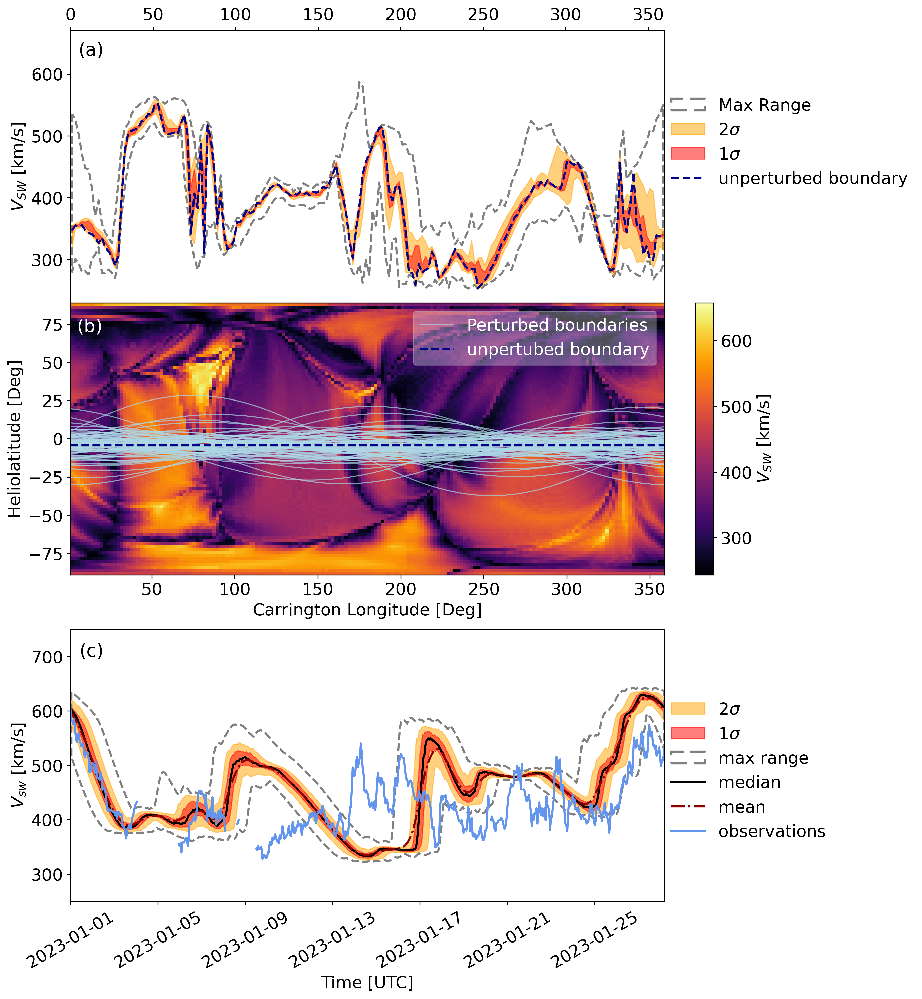

In [134]:
##### PLOTTING ######

fig = plt.figure(figsize = (11,15), dpi=300)

gs = grd.GridSpec(4, 2, height_ratios=[5,5,1,5], width_ratios=[10,0.3], wspace=0.1, hspace=0.0)

## plotting the WSA map with velocity boundaries
ax1 = plt.subplot(gs[2])
im = ax1.imshow(vr_map_deacc.value, cmap = 'inferno', aspect = 'auto',
           extent = [WSA_vr_longs[0].to(u.deg).value, WSA_vr_longs[-1].to(u.deg).value,
                     WSA_vr_lats[0].to(u.deg).value,WSA_vr_lats[-1].to(u.deg).value])

#plot perturbed boundaries
for boundary in perturbed_boundary_paths:
    ax1.plot(WSA_vr_longs.to(u.deg).value, boundary.to(u.deg).value, color = 'lightblue', lw = 1, alpha = 0.7)

ax1.plot(WSA_vr_longs.to(u.deg).value, boundary.to(u.deg).value, color = 'lightblue', lw = 1, alpha = 0.7, 
             label = 'Perturbed boundaries')

#axes[1].plot(WSA_vr_longs.to(u.deg).value, boundary.to(u.deg).value, color = 'blue', lw = 1, alpha = 0.5)
ax1.axhline(E_lat.to(u.deg).value, color = 'darkblue', linestyle = '--', label = r'unpertubed boundary', lw=2)


cbax = plt.subplot(gs[3])
cb = plt.colorbar(im, cax = cbax, label = r'$V_{SW}$ [km/s]', orientation = 'vertical', aspect = 30)#, location = 'bottom')
ax1.set_xlabel('Carrington Longitude [Deg]')
ax1.set_ylabel('Heliolatitude [Deg]')

ax1.legend(framealpha = 0.3, labelcolor = 'white')


### plotting ensemble of inner boundaries
ax2 = plt.subplot(gs[0])
ax2.tick_params(top=True, labeltop=True, bottom=False, labelbottom=False)
ax2.fill_between(WSA_vr_longs.to(u.deg).value, np.min(velocity_boundaries, axis = 0), np.max(velocity_boundaries, axis = 0), 
                     linestyle = '--', color = 'grey', facecolor = 'None', label = 'Max Range', lw=2)

ax2.fill_between(WSA_vr_longs.to(u.deg).value, np.percentile(velocity_boundaries,13.6, axis = 0), np.percentile(velocity_boundaries, (100-13.6), axis = 0),
                     edgecolor = 'None', label = r'2$\sigma$', color = 'orange', alpha=0.5)
ax2.fill_between(WSA_vr_longs.to(u.deg).value, np.percentile(velocity_boundaries,34, axis = 0), np.percentile(velocity_boundaries, 68, axis = 0),
                     edgecolor = 'None', label = r'1$\sigma$', color = 'red', alpha=0.5)

ax2.set_ylim(230,670)

ax2.plot(WSA_vr_longs.to(u.deg).value, INT(WSA_vr_longs.value, np.ones(180)*E_lat.value), 
             color = 'darkblue', linestyle = '--', label = r'unperturbed boundary', lw=2)
ax2.set_ylabel(r'$V_{SW}$ [km/s]')

#ax2.set_title('Carrington Longitude [deg]', fontsize=15)
ax2.legend(frameon = False, ncols = 1, loc=(1,0.4))
ax2.set_xlim(0,360)


ax3 = plt.subplot(gs[6])

daily_index = 0
statistics_df = generate_ensemble_statistics(daily_ensemble_sets[daily_index])

ax3.fill_between(statistics_df.index, statistics_df['2s_lower_percentile'], statistics_df['2s_upper_percentile'], label = r'2$\sigma$', color = 'orange', alpha=0.5 )
ax3.fill_between(statistics_df.index, statistics_df['1s_lower_percentile'], statistics_df['1s_upper_percentile'], label = r'1$\sigma$', color = 'red', alpha=0.5)
ax3.fill_between(statistics_df.index[1:-1], statistics_df['min'][1:-1], statistics_df['max'][1:-1], facecolor = 'none', edgecolor = 'grey', linestyle = '--', label = 'max range', lw=2 )
ax3.plot(statistics_df.index, statistics_df['median'], color = 'black', label = 'median', lw =2)
ax3.plot(statistics_df.index, statistics_df['mean'], color = 'darkred', linestyle = '-.', label = 'mean', lw=2)

ax3.plot(daily_ensemble_sets[daily_index]['observation'], color='cornflowerblue', label = 'observations', lw=2)
ax3.set_ylim(250,750)
ax3.set_xlim(daily_ensemble_sets[daily_index].index[0], daily_ensemble_sets[daily_index].index[-1])

ax3.set_xlabel('Time [UTC]')
ax3.set_ylabel(r'$V_{sw}$ [km/s]')
ax3.legend(frameon=False, ncols=1, loc=(1,0.2))
ax3_lab = ax3.get_xticklabels()
ax3.set_xticklabels(ax3_lab, rotation =30)



ax2.annotate('(a)', (5, 630), fontsize='xx-large')
ax1.annotate('(b)', (5, 70), fontsize='xx-large', color='white')
ax3.annotate('(c)', (daily_ensemble_sets[daily_index].index[10], 700), fontsize='xx-large')


filename = "wsa_ensemble_pipeline.pdf"
fpath = f"C:\\Users\\ct832900\\OneDrive - University of Reading\\WSA calibration paper\\figures_01\\{filename}"
plt.savefig(fpath, format = 'pdf', dpi = 300, bbox_inches='tight')

#plt.gcf().autofmt_xdate()
#plt.tight_layout()
plt.show()

0
27
54
81


C:\Users\ct832900\AppData\Local\Temp\ipykernel_9824\1164571238.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax_lab, rotation =10)
C:\Users\ct832900\AppData\Local\Temp\ipykernel_9824\1164571238.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax_lab, rotation =10)
C:\Users\ct832900\AppData\Local\Temp\ipykernel_9824\1164571238.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax_lab, rotation =10)
C:\Users\ct832900\AppData\Local\Temp\ipykernel_9824\1164571238.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax_lab, rotation =10)
C:\Users\ct832900\AppData\Local\Temp

108
135
162
189


C:\Users\ct832900\AppData\Local\Temp\ipykernel_9824\1164571238.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax_lab, rotation =10)
C:\Users\ct832900\AppData\Local\Temp\ipykernel_9824\1164571238.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax_lab, rotation =10)
C:\Users\ct832900\AppData\Local\Temp\ipykernel_9824\1164571238.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax_lab, rotation =10)
C:\Users\ct832900\AppData\Local\Temp\ipykernel_9824\1164571238.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax_lab, rotation =10)
C:\Users\ct832900\AppData\Local\Temp

216
243
270


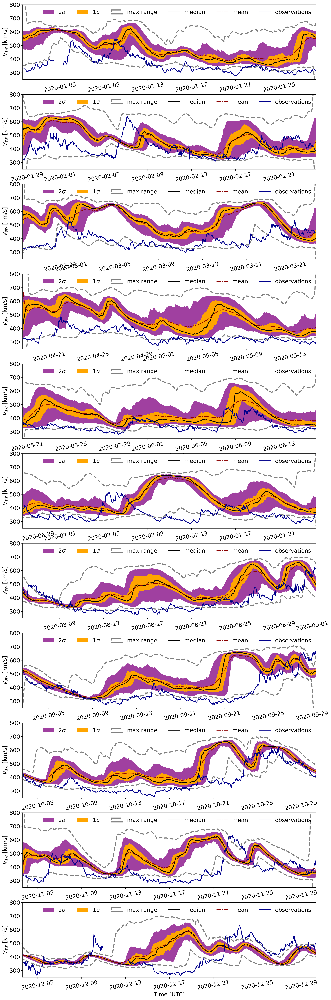

In [39]:
index_to_plot = np.arange(0,len(daily_ensemble_sets),27)

fig, axes = plt.subplots(nrows=len(index_to_plot), ncols=1, figsize=(15,50), dpi=300)

axes=axes.flatten()

for i, idx in enumerate(index_to_plot):

    print(idx)

    statistics_df = generate_ensemble_statistics(daily_ensemble_sets[idx])

    ax = axes[i]

    ax.fill_between(statistics_df.index, statistics_df['2s_lower_percentile'], statistics_df['2s_upper_percentile'], label = r'2$\sigma$', color = 'purple', alpha=0.75,lw=0)
    ax.fill_between(statistics_df.index, statistics_df['1s_lower_percentile'], statistics_df['1s_upper_percentile'], label = r'1$\sigma$', color = 'orange',lw=0)
    ax.fill_between(statistics_df.index[1:-1], statistics_df['min'][1:-1], statistics_df['max'][1:-1], facecolor = 'none', edgecolor = 'grey', linestyle = '--', label = 'max range', lw=3 )
    ax.plot(statistics_df.index, statistics_df['median'], color = 'black', label = 'median', lw =2)
    ax.plot(statistics_df.index, statistics_df['mean'], color = 'darkred', linestyle = '-.', label = 'mean', lw=2)

    ax.plot(daily_ensemble_sets[idx]['observation'], color='darkblue', label = 'observations', lw=2)
    ax.set_ylim(250,800)
    ax.set_xlim(daily_ensemble_sets[idx].index[2], daily_ensemble_sets[idx].index[-3])
    ax.set_ylabel(r'$V_{sw}$ [km/s]')

    ax.set_xlabel('Time [UTC]')  
    ax_lab = ax.get_xticklabels()
    ax.set_xticklabels(ax_lab, rotation =10)
    ax.legend(frameon=False, ncols=6)
#plt.gcf().autofmt_xdate()
#plt.tight_layout()
plt.show()

### Rank Histogram Pipeline

In [72]:
# Compute ensemble ranks for each enesmble time step and daily ensemble set

for j, df_ in enumerate(daily_ensemble_sets):
    ranks = []
    for i in range(len(df_)):
        row = df_.iloc[i]

        if np.isnan(row['observation']) == True:
            rank = np.nan
        else:
            rank = np.sum(row.filter(like='vsw').to_numpy() > row['observation'])
        ranks.append(rank)

    df_['rank'] = ranks


In [73]:

def calculate_rank_chi_square(ensemble_size, ranked_forecasts):
    """
    calculated rank histogram chi square value -- indication of histogram flatness

    Args:
        ensemble_size (int) : number of ensemble members
        ranked_forecast (array) : ranked forecast timeseries
    
    Returns:
        chi_sq (float) : chi squared value 
    """

    ensemble_hist = np.histogram(ranked_forecasts, bins = ensemble_size)[0]

    chi_sq = 0 
    
    for i in range(ensemble_size):
        # loop through each rank and follow summation formula
        chi_sq += (ensemble_hist[i]/np.sum(ensemble_hist) - 1/(ensemble_size+1))**2

    chi_sq = chi_sq*np.sum(ensemble_hist)*(ensemble_size+1) # scaling by n(n+1)

    return chi_sq


In [74]:
compiled_ranks = [df_['rank'] for df_ in daily_ensemble_sets]

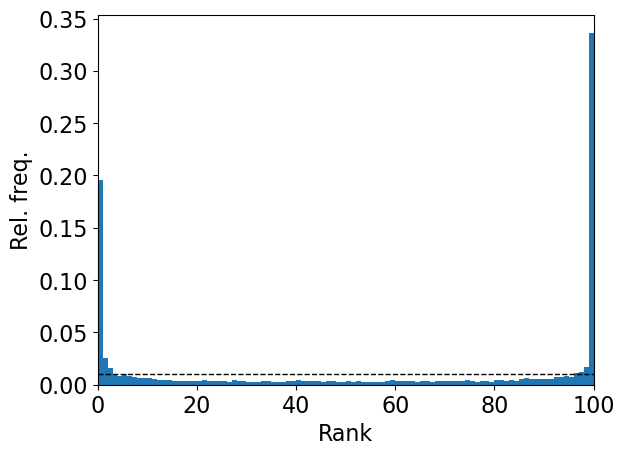

In [75]:
plt.hist(pd.concat(compiled_ranks),ensemble_size, density=True)
plt.axhline(1/ensemble_size, lw = 1, color='black', linestyle='--')
plt.xlim(0,100)
plt.xlabel('Rank')
plt.ylabel('Rel. freq.')
plt.show()

C:\Users\ct832900\AppData\Local\Temp\ipykernel_11044\434985586.py:22: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=30)
C:\Users\ct832900\AppData\Local\Temp\ipykernel_11044\434985586.py:45: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax2.get_xticklabels(), rotation=30)


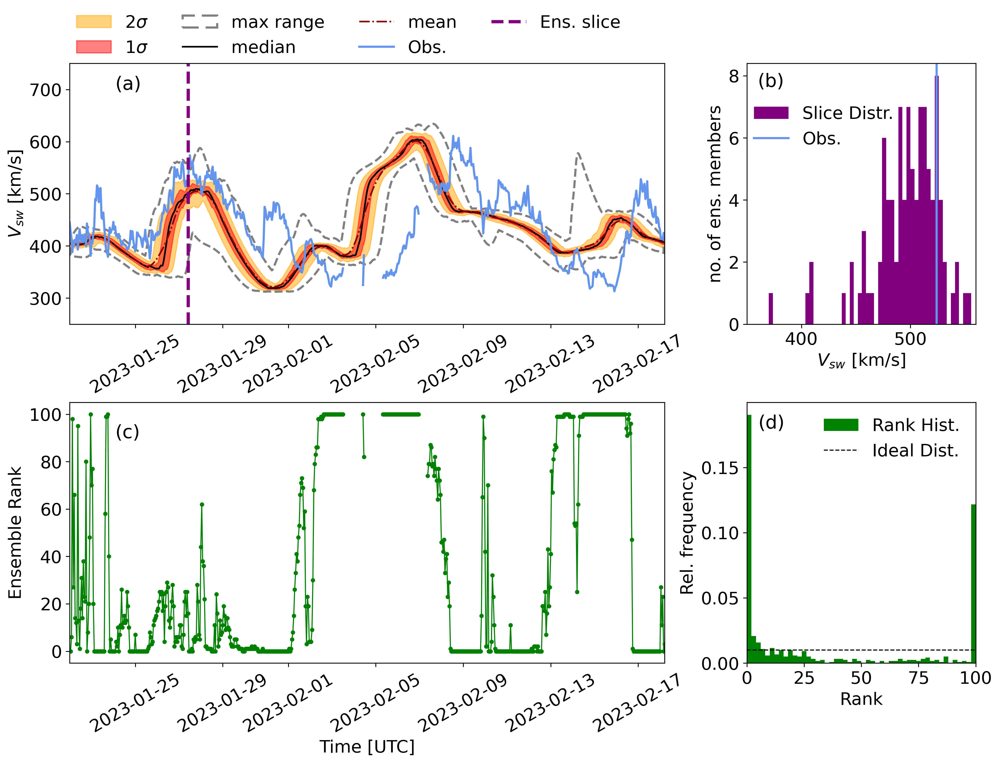

In [129]:
daily_index = 21
time_index = 130

statistics_df = generate_ensemble_statistics(daily_ensemble_sets[daily_index])

fig = plt.figure(figsize = (15,10),dpi=300)

gs = grd.GridSpec(2, 2, height_ratios=[5,5], width_ratios=[13,5], wspace=0.2, hspace=0.3)

ax = plt.subplot(gs[0])

ax.fill_between(statistics_df.index, statistics_df['2s_lower_percentile'], statistics_df['2s_upper_percentile'], label = r'2$\sigma$', color = 'orange', alpha=0.5 )
ax.fill_between(statistics_df.index, statistics_df['1s_lower_percentile'], statistics_df['1s_upper_percentile'], label = r'1$\sigma$', color = 'red', alpha=0.5)
ax.fill_between(statistics_df.index[1:-1], statistics_df['min'][1:-1], statistics_df['max'][1:-1], facecolor = 'none', edgecolor = 'grey', linestyle = '--', label = 'max range', lw=2)
ax.plot(statistics_df.index, statistics_df['median'], color = 'black', label = 'median')
ax.plot(statistics_df.index, statistics_df['mean'], color = 'darkred', linestyle = '-.', label = 'mean')

ax.plot(daily_ensemble_sets[daily_index]['observation'], color='cornflowerblue', label = 'Obs.', lw=2)
ax.axvline(daily_ensemble_sets[daily_index].index[time_index], color = 'purple', lw=3, linestyle='--', label='Ens. slice')
ax.set_ylim(250,750)
ax.set_xlim(daily_ensemble_sets[daily_index].index[0], daily_ensemble_sets[daily_index].index[-1])
ax.set_xticklabels(ax.get_xticklabels(), rotation=30)

time_idx = daily_ensemble_sets[daily_index].index[50]
ax.annotate('(a)', (time_idx, 700), fontsize='xx-large')

#ax.set_xlabel('Time [UTC]')
ax.set_ylabel(r'$V_{sw}$ [km/s]')
ax.legend(frameon=False, ncols=4, loc=(0,1))

ax1 = plt.subplot(gs[1])
ax1.hist(daily_ensemble_sets[daily_index].iloc[time_index].filter(like='vsw'), color='purple', bins=50, label='Slice Distr.')
ax1.axvline(daily_ensemble_sets[daily_index].iloc[time_index]['observation'], color = 'cornflowerblue', lw=2, linestyle='-', label = 'Obs.')
ax1.legend(frameon=False, loc=(0,0.65))
ax1.set_xlim(350,560)
ax1.set_ylabel('no. of ens. members')
ax1.set_xlabel(r'$V_{sw}$ [km/s]')
ax1.annotate('(b)', (360, 7.65), fontsize='xx-large')

ax2 = plt.subplot(gs[2])
ax2.plot(daily_ensemble_sets[daily_index]['rank'], color='green', marker = '.', lw=1)
ax2.set_ylabel('Ensemble Rank')
ax2.set_xlabel('Time [UTC]')
ax2.set_xlim(daily_ensemble_sets[daily_index].index[0], daily_ensemble_sets[daily_index].index[-1])
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=30)
ax2.annotate('(c)', (time_idx, 90), fontsize='xx-large')

ax3 = plt.subplot(gs[3])
ax3.hist(daily_ensemble_sets[daily_index]['rank'], color='green', density=True, bins=50, label='Rank Hist.')
ax3.set_ylabel('Rel. frequency')
ax3.set_xlabel('Rank')
ax3.axhline(1/ensemble_size, lw=1, color='black', linestyle = '--', label='Ideal Dist.')
ax3.set_xlim(0,100)
ax3.legend(frameon=False)
ax3.annotate('(d)', (5, 0.18), fontsize='xx-large')

filename = "rank_histogram_series.pdf"
fpath = f"C:\\Users\\ct832900\\OneDrive - University of Reading\\WSA calibration paper\\figures_01\\{filename}"
plt.savefig(fpath, format = 'pdf', dpi = 300, bbox_inches='tight')

plt.show()

C:\Users\ct832900\AppData\Local\Temp\ipykernel_12972\3130456411.py:37: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[-1].set_xticklabels(ax_lab, rotation =10)


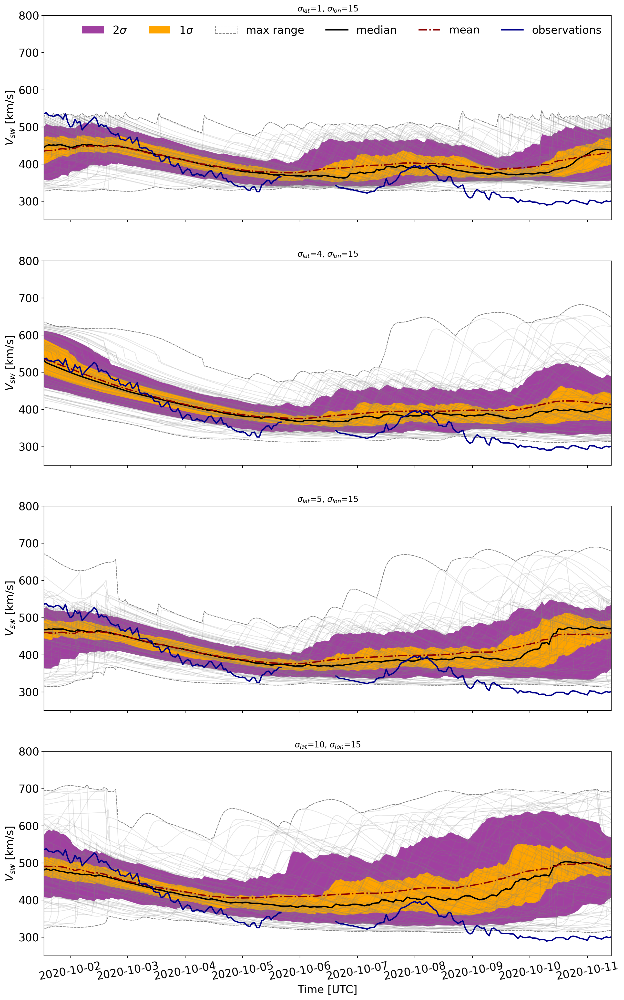

In [96]:
# ensemble parameters
ensemble_size = 100
sigma_latitude = 4 # degrees
sigma_longitude = 15 # degrees
year_str = '2020'

# specify date range of ensemble to load in
start_date = datetime.datetime(2020,10,1)
end_date = datetime.datetime(2020,10,7)

idx=0

fig, axes = plt.subplots(4,1,dpi=200,figsize=(15,25), sharex = True)

sigma_latitudes = [1,4,5,10]
gen_dist= '_uniform'
for i, ax in enumerate(axes):
    sigma_latitude = sigma_latitudes[i]
    daily_ensemble_sets = read_daily_ensemble_sets(ensemble_size, sigma_latitude, sigma_longitude, year_str, start_date, end_date, df_filtered,gen_dist)
    statistics_df = generate_ensemble_statistics(daily_ensemble_sets[idx])
    ax.plot(daily_ensemble_sets[idx].filter(like='vsw'), color='grey', alpha=0.2, lw=1)
    ax.fill_between(statistics_df.index, statistics_df['2s_lower_percentile'], statistics_df['2s_upper_percentile'], label = r'2$\sigma$', color = 'purple', alpha=0.75,lw=0)
    ax.fill_between(statistics_df.index, statistics_df['1s_lower_percentile'], statistics_df['1s_upper_percentile'], label = r'1$\sigma$', color = 'orange',lw=0)
    ax.fill_between(statistics_df.index, statistics_df['min'], statistics_df['max'], facecolor = 'none', edgecolor = 'grey', linestyle = '--', label = 'max range', lw=1 )
    ax.plot(statistics_df.index, statistics_df['median'], color = 'black', label = 'median', lw =2)
    ax.plot(statistics_df.index, statistics_df['mean'], color = 'darkred', linestyle = '-.', label = 'mean', lw=2)
    

    ax.plot(daily_ensemble_sets[idx]['observation'], color='darkblue', label = 'observations', lw=2)
    ax.set_ylim(250,800)
    ax.set_xlim(daily_ensemble_sets[idx].index[0], daily_ensemble_sets[idx].index[-1])
    ax.set_ylabel(r'$V_{sw}$ [km/s]')
    ax.set_title(f'$\sigma_{{lat}}$={sigma_latitude}, $\sigma_{{lon}}$={sigma_longitude}')

axes[-1].set_xlabel('Time [UTC]')  
ax_lab = ax.get_xticklabels()
axes[-1].set_xticklabels(ax_lab, rotation =10)
axes[0].legend(frameon=False, ncols=6)
#plt.gcf().autofmt_xdate()
#plt.tight_layout()
plt.show()

In [31]:
def perturb_longitude(longitudinal_disp, ensemble_member):
    
    """
    perturbs an ensemble member longitudinally
    longitududinal perturbation is equivalent to a temporal displacement of ensemble member

    Args:
        longitudinal_disp (float) : angular displacement for longitudinal perturbation in units of radians
        ensemble_member (dataFrame) : single ensemble member dataframe
    
    Returns:
        shifted_ensemble_member (dataFrame) : ensemble member shifted in time related by the longitudinal displacement

    """

    # convert angular displacement into a temporal displacement
    carrington_rotation = 27.2753
    long_pert_dt = ((longitudinal_disp * carrington_rotation) / (2*np.pi)) 

    # Ensure that the DataFrame has a datetime index
    if not isinstance(ensemble_member.index, pd.DatetimeIndex):
        raise ValueError("DataFrame must have a datetime index")
    
    # Timedelta to shift time axis
    time_shift = pd.Timedelta(long_pert_dt, unit='D')

    # Interpolate ensemble member
    #INT = scipy.interpolate.CubicSpline(ensemble_member.index, ensemble_member)
    ### Try a linear interpolation
   
    INT = scipy.interpolate.interp1d(ensemble_member.index.astype('int64') // 10**9, ensemble_member.to_numpy().reshape(-1), kind='linear', fill_value='extrapolate')
    
    # Shift index
    shifted_index = ensemble_member.index - time_shift

    # Interpolate timeseries onto shifted time index
    shifted_timeseries = INT(shifted_index.astype('int64') // 10**9)
    
    # Place interpolated timeseries onto original time index
    shifted_ensemble_member = pd.DataFrame({'vsw':shifted_timeseries.reshape(-1)}, index = ensemble_member.index)

    return shifted_ensemble_member

def perturb_longitude_old(longitudinal_disp, ensemble_member):

    """
    perturbs an ensemble member longitudinally
    longitududinal perturbation is equivalent to a temporal displacement of ensemble member

    Args:
        longitudinal_disp (float) : angular displacement for longitudinal perturbation in units of radians
        ensemble_member (dataFrame) : single ensemble member dataframe
    
    Returns:
        perturbed_ensemble_member (dataFrame) : ensemble member shifted in time related by the longitudinal displacement

    """

    # convert angular displacement into a temporal displacement
    carrington_rotation = 27.2753*u.day
    long_pert_dt = ((longitudinal_disp * carrington_rotation.value) / (2*np.pi)) * u.day

    # Ensure that the DataFrame has a datetime index
    if not isinstance(ensemble_member.index, pd.DatetimeIndex):
        raise ValueError("DataFrame must have a datetime index")
    
    shift_amount = int(long_pert_dt.to(u.second).value) # Convert shift amount into seconds

    # Convert datetime index into integers
    numeric_index = ensemble_member.index.astype('int64') // 10**9 # Floor division to convert into seconds (UNIX int datetime is in nanoseconds)
    numeric_index = numeric_index.to_numpy()

    # Calculate the new index by shifting with wrapping
    shifted_index = numeric_index + shift_amount

    # Generate boolean array which captures elements above and below max/min indices
    wrap_mask = (shifted_index < numeric_index.min()) | (shifted_index > numeric_index.max())
  
    if shift_amount < 0:
        # If negative shift amount (i.e. elements will be below min index)
        shifted_index[wrap_mask] = shifted_index[wrap_mask] + (shifted_index.max() - shifted_index.min())

    elif shift_amount > 0:
        # If positive shift amount (i.e. elements will be above max index)  
        shifted_index[wrap_mask] = shifted_index[wrap_mask] - (shifted_index.max() - shifted_index.min())

    else:
        # No change -- preserve original index
        shifted_index = numeric_index

    # Convert back to datetime index
    new_converted_index = pd.to_datetime(shifted_index, unit='s')

    # Sort the DataFrame based on the new index
    df_shifted = ensemble_member.copy()
    df_shifted = (df_shifted.sort_index().set_index(new_converted_index)).sort_index()
    df_shifted = df_shifted[~(df_shifted.index).duplicated()].copy()

    # Interpolate shifted dataframe back onto orignal datetime axis (for more ease in later analysis)
    #Int = scipy.interpolate.CubicSpline(df_shifted.index, df_shifted['vsw'])
    Int = scipy.interpolate.interp1d(df_shifted.index.astype('int64') // 10**9, df_shifted['vsw'], fill_value='extrapolate')
    data_time_axis = ensemble_member.index
    interpolated_forecast_output = Int(data_time_axis.astype('int64') // 10**9)
    
    return pd.DataFrame({'vsw':interpolated_forecast_output}, index = data_time_axis)


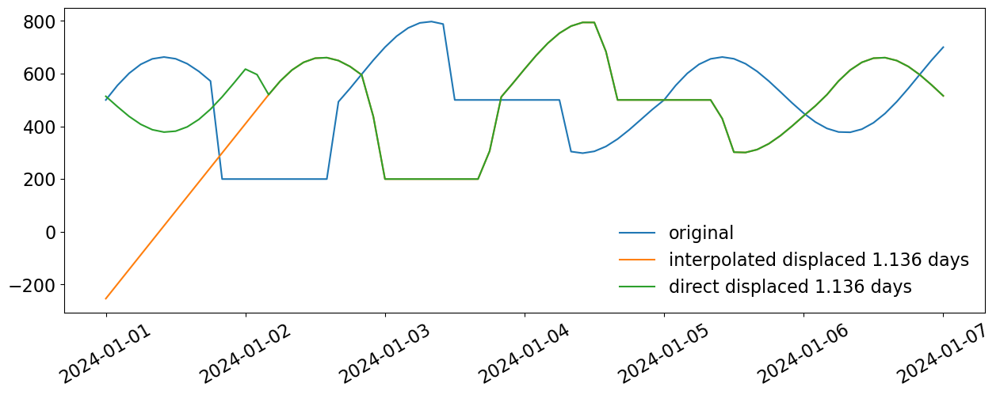

In [39]:
t = pd.date_range('2024-01-01','2024-01-07', freq='2h')
x = np.linspace(0,3*np.pi,len(t)) 
vsw = 500 + 400*np.sin(x) * np.cos(x+0.5) + 200*abs(np.sin(0.5*x))
vsw[10:20] = 200
vsw[30:40] = 500

df_test = pd.DataFrame({'vsw':vsw}, index=t)

sigma_longitude = 60
random_seed=10
rng = np.random.default_rng(random_seed)
long_disp = rng.normal(loc=0, scale=np.radians(sigma_longitude), size=1)

long_disp = [np.radians(15)]

df_pert_interp = perturb_longitude(longitudinal_disp=long_disp[0], ensemble_member=df_test)

df_pert_shift = hef.perturb_longitude(longitudinal_disp=long_disp[0], ensemble_member=df_test)

carrington_rotation = 27.2753
long_pert_dt = ((long_disp[0] * carrington_rotation) / (2*np.pi)) 

plt.figure(figsize=(15,5))
plt.plot(df_test, label='original')
plt.plot(df_pert_interp, label= f'interpolated displaced {long_pert_dt:.3f} days')
plt.plot(df_pert_shift, label= f'direct displaced {long_pert_dt:.3f} days')
plt.xticks(rotation=30)
plt.legend(frameon=False)
plt.show()

In [160]:
def generate_ensemble_forecast(params):
    """
    creates an ensemble of HUXt model runs by spatially perturbing inner boundary

    Args:
        params (tuple) : contains information needed to generate ensemble

        ----------------------- FORMAT ------------------------
        format : (filname, ensemble_size, sigma_latitude, forecast_window, r_min) 
        filename (string) : name of coronal model file name
        ensemble_size (int) : number of ensemble members
        sigma_latitude (float) : scale paramater which controls spread of intial conditions in degrees
        forecast_window (float) : duration of model run/forecast length in units of days
        r_min (float) : distance of inner boundary from Sun in units of solar radii 
        
    Returns:
        ensemble_members (list) : list of dataFrames of model runs, timeseries extracted at Earth
    """

    # Extract ensemble information
    filename = params[0]
    ensemble_size = params[1]
    sigma_latitude = np.radians(params[2])
    forecast_window = params[3]
    r_min = params[4] # WSA at 21.5 rS

    _, date_obj = hef.wsa_date_from_string(filename)
    print(f'{_} now generating')
    # forecast_time = datetime.datetime(int(year), int(month), int(day), 12, 00, 0)
    random_seed = int(date_obj.strftime("%y%m%d%H%M"))

    rng = np.random.default_rng(random_seed) # Initialise random number generator

    # filepath for accessing wsa files
    directory_path = H._setup_dirs_()['boundary_conditions']
    filepath = os.path.join(directory_path, filename)

    # get WSA velocity map and create interpolation solution
    WSA_vr_map, WSA_vr_longs, WSA_vr_lats, WSA_br_map, WSA_br_lats, WSA_br_longs, WSA_cr = Hin.get_WSA_maps(filepath)

    # deaccelerate the WSA map from 1-AU calibrated speeds to expected 21.5 rS values
    vr_map_deacc = WSA_vr_map.copy()
    for nlat in range(1, len(WSA_vr_lats)):
        vr_map_deacc[nlat, :], lon_temp = Hin.map_v_inwards(WSA_vr_map[nlat, :], 215 * u.solRad,
                                                            WSA_vr_longs, 21.5 * u.solRad)

    INT = hef.interpolate_vmap(vr_map_deacc.value, WSA_vr_lats.value, WSA_vr_longs.value)

    # forecast characteristics
    E_lat = hef.earth_latitude_wsa(filename = filename) # sub earth path as basis for 'true' initial conditions
    init_wsa_date_str, init_wsa_date = hef.wsa_date_from_string(filename) # forecast start time
    cr, cr_lon_init = Hin.datetime2huxtinputs(pd.Timestamp(init_wsa_date)) # start time translated into carrington rotation + longitudinal component

    # Generate perturbed inner boundary paths
    perturbed_boundary_paths = hef.gen_ensemble_perturbed_boundary_path(E_lat = E_lat.value, longitudes=WSA_vr_longs.value, 
                                                            ensemble_size = ensemble_size, sigma_latitude = sigma_latitude, random_seed = random_seed)

    # Generate ensemble of interpolated near-sun velocity boundaries
    velocity_boundaries = [hef.extract_interpolated_velocity_boundary(interpolated_map_solution=INT, boundary=boundary.value, longitudes=WSA_vr_longs.value) 
                        for boundary in perturbed_boundary_paths]

    # Initialise ensemble member list
    ensemble_members = []

    for v_boundary in velocity_boundaries:

        # set up and run HUXt model. 
        model = H.HUXt(v_boundary=v_boundary*(u.km/u.s), cr_num=cr, cr_lon_init=cr_lon_init, simtime=forecast_window, dt_scale=4, r_min = r_min)
        model.solve([])

        # Extract Earth time series dataFrame
        df_earth_series = HA.get_observer_timeseries(model, observer = 'Earth')
        df_earth_series = df_earth_series.rename(columns = {'time':'datetime'}) # rename time column to match OMNI dataframe format (for ease later on)
        df_earth_series['datetime'] = df_earth_series['datetime'].values.astype(dtype='datetime64[ns]') # setting index to datetime ready for longitudinal perturbation
        df_earth_series = df_earth_series.set_index('datetime')
        ensemble_members.append(df_earth_series.copy())

    return ensemble_members

In [178]:
directory_path = H._setup_dirs_()['boundary_conditions']
wsa_file_words = ['gongz'] # keywords to filter for in coronal model file directory

# create wsa filepaths
wsa_fnames = hef.get_files_containing_words(directory_path, wsa_file_words)
wsafilepaths = [os.path.join(directory_path, fname) for fname in wsa_fnames]

wsa_dates = [hef.wsa_date_from_string(fname)[1] for fname in wsa_fnames]

df_wsa_files = pd.DataFrame({'filepath':wsafilepaths}, index=wsa_dates)

# Extract ensemble information
filename = wsafilepaths[200]
ensemble_size = 10
sigma_latitude = 5
forecast_window = 27.2753 * u.day
r_min = 21.5 * u.solRad
year = '2020'

params = (filename, ensemble_size, sigma_latitude, forecast_window, r_min, year)
ensemble_members = generate_ensemble_forecast(params)


2020-08-10--12 now generating


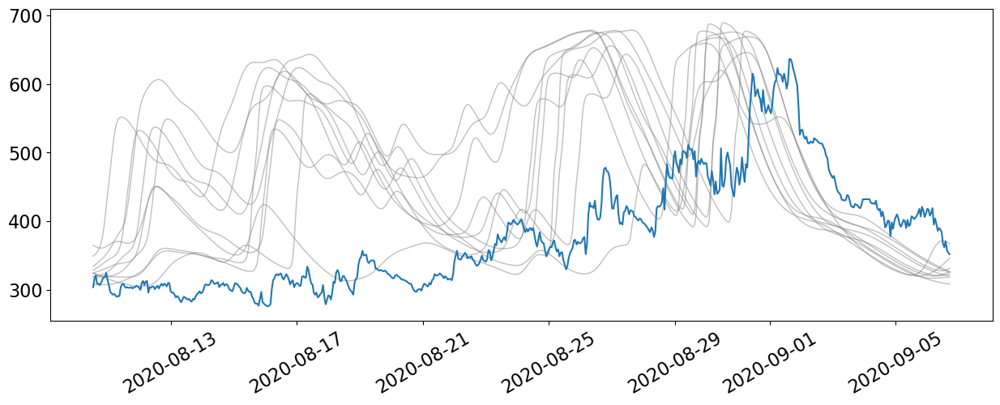

In [179]:
sigma_longitude = 10
lp_ens_members = hef.perturb_ensemble_longitudinally(ensemble_members=ensemble_members, sigma_longitude=sigma_longitude, 
                                                        ensemble_size=ensemble_size, random_seed=random_seed)

observed_df = df_filtered['V'][lp_ens_members[0].index[0]:lp_ens_members[0].index[-1]]
resampled_ensemble_data = [hef.interpolate_and_resample(observed_data=observed_df, forecast_series=ens_mem) for ens_mem in lp_ens_members]

resampled_ensembles_df = pd.DataFrame(np.stack(resampled_ensemble_data).T, index=observed_df.index, columns=[f'vsw_{i}' for i in range(ensemble_size)])
resampled_ensembles_df['observation'] = observed_df


plt.figure(figsize=(15,5))
plt.plot(resampled_ensembles_df.filter(like='vsw'), color='grey', lw=1, alpha=0.5)
plt.plot(resampled_ensembles_df['observation'])
plt.xticks(rotation=30)
plt.show()


